# Proyecto Final ML - Colorización de Imagenes

## Descargar Datasets si es necesario

In [ ]:
!pip install opendatasets
import opendatasets as od


def rename_folder(old_name, new_name):

    # Verifica si el nuevo nombre de la carpeta ya existe
    if os.path.exists(new_name):
        # Borra la carpeta existente para hacer espacio
        shutil.rmtree(new_name)
    try:
        # Renombra la carpeta
        os.rename(old_name, new_name)
        print(f"La carpeta ha sido renombrada de '{old_name}' a '{new_name}' con éxito.")
    except OSError as e:
        print(f"Error: {e}")

# Celeba dataset
def download_celeba_dataset():
  od.download("https://www.kaggle.com/datasets/jessicali9530/celeba-dataset/data","./")

  old_folder_name = "celeba-dataset"
  new_folder_name = "CelebA"
  rename_folder(old_folder_name, new_folder_name)
def download_art_dataset():
  od.download("https://www.kaggle.com/datasets/thedownhill/art-images-drawings-painting-sculpture-engraving/training_set/painting/","./")

  shutil.move("/content/art-images-drawings-painting-sculpture-engraving/dataset/dataset_updated/training_set/painting",  "./paintings/dataset")

  !rm -rf /content/art-images-drawings-painting-sculpture-engraving

#Descomentar si necesitas descargar
# download_celeba_dataset()
# download_art_dataset()

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: antoniostepsich
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/thedownhill/art-images-drawings-painting-sculpture-engraving


100%|██████████| 583M/583M [00:01<00:00, 393MB/s]


## Empieza Pix2Pix

## Imports

In [2]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import os
from PIL import Image
from IPython.display import clear_output
from tqdm.notebook import tqdm
import io
import random
import shutil

from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications.inception_v3 import preprocess_input


#seed random
random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)


batch_size = 1
img_size = 256


BETA_1 = 0.5
LEARNING_RATE = 2e-4
LAMBDA = 100


## Path necesarios

Poner los path necesario donde se guardaran las cosas
Es importante que esten todas las carpetas creadas vacias o no, pero si o si tiene que estar el Dataset

In [76]:
# Ruta de la carpeta donde están las imágenes

path_dataset = '/content/paintings/dataset/painting'
path_target = "/content/paintings/target/"
path_train = "/content/paintings/train/"
checkpoint_folder = "/content/paintings/checkpoints/"
path_output = "/content/paintings/output/"

# path_dataset = '/content/CelebA/img_align_celeba/img_align_celeba/'
# path_target = '/content/CelebA/img_align_celeba/target/'
# path_train = '/content/CelebA/img_align_celeba/train/'
# checkpoint_folder = "/content/CelebA/checkpoints/"
# path_output = "/content/CelebA/output_2500_lr4/"


# checkpoint_folder = "/content/paintings/checkpoints/"

## Creación de imagenes en ByN

In [77]:
def load_jpg_images(path_dataset, path_target, archivos_a_mover=1000):
    # Asegúrate de que el directorio objetivo exista, si no, créalo
    if not os.path.exists(path_target):
        os.makedirs(path_target)

    # Obtiene todos los archivos .jpg en la carpeta
    archivos = [archivo for archivo in os.listdir(path_dataset) if archivo.endswith('.jpg')]

    # Mezcla la lista de archivos al azar
    random.shuffle(archivos)

    # Selecciona los primeros 'archivos_a_mover' archivos para mover
    archivos_para_mover = archivos[:archivos_a_mover]

    # Mueve los archivos seleccionados a la carpeta objetivo
    for archivo in archivos_para_mover:
        shutil.copy(os.path.join(path_dataset, archivo), os.path.join(path_target, archivo))

    print(f'Se han copiado {len(archivos_para_mover)} archivos a {path_target}.')

def convert_to_l(path_target, path_train):
  imgurls = [f for f in os.listdir(path_target) if os.path.isfile(os.path.join(path_target, f))]
  print(f"Se encontraron {len(imgurls)} archivos en el directorio de target.")

  # Procesa cada imagen
  for image in tqdm(imgurls):
      try:
          # Abrir la imagen
          with Image.open(os.path.join(path_target, image)) as img:
            img = img.convert('L')
            img = img.convert('RGB')   #sacar despues
            img.save(os.path.join(path_train, image))
      except:
        pass

  print('Conversion completada')

def convert_to_rgb(path_target):
  # Lista todos los archivos en el directorio de entrenamiento
  imgurls = [f for f in os.listdir(path_target) if os.path.isfile(os.path.join(path_target, f))]
  print(f"Se encontraron {len(imgurls)} archivos en el directorio de target.")

  # Procesa cada imagen
  for image in tqdm(imgurls):
      try:
          # Abrir la imagen
          with Image.open(os.path.join(path_target, image)) as img:
              # Convertir a RGB
              img = img.convert(mode='RGB')
              # Guardar la imagen en el directorio objetivo
              img.save(os.path.join(path_target, image))
      except:
        pass

  print('Conversion completada')

In [78]:
def prepare_data(path_dataset, path_target, path_train, files_to_prepare=1000):
  !rm -rf {path_train}
  !rm -rf {path_target}
  !mkdir {path_train}
  !mkdir {path_target}

  load_jpg_images(path_dataset, path_target, files_to_prepare)

  convert_to_l(path_target, path_train)
  convert_to_rgb(path_target)

In [79]:

prepare_data(path_dataset, path_target, path_train, 2500)

Se han copiado 2128 archivos a /content/paintings/target/.
Se encontraron 2128 archivos en el directorio de target.


  0%|          | 0/2128 [00:00<?, ?it/s]

Conversion completada
Se encontraron 2128 archivos en el directorio de target.


  0%|          | 0/2128 [00:00<?, ?it/s]

Conversion completada


## Inicialización de **Paths**

 Dividimos el Dataset entre **Train** y **Test** siendo una relacion de 80% a 20%

In [80]:
def split_dataset(path_train, train_percentage=0.7, val_percentage=0.15):
    # Listar todas las imágenes en el directorio de entrenamiento
    imgurls = [f for f in os.listdir(path_train) if os.path.isfile(os.path.join(path_train, f))]
    cantidad_de_imagenes = len(imgurls)
    print(f"La cantidad de imágenes totales son {cantidad_de_imagenes}")

    # Calcular los índices de corte para las divisiones
    train_index = int(train_percentage * cantidad_de_imagenes)
    val_index = train_index + int(val_percentage * cantidad_de_imagenes)

    # Dividir los datos en train, validation y test
    train_urls = imgurls[:train_index]
    val_urls = imgurls[train_index:val_index]
    test_urls = imgurls[val_index:]

    print(f"La cantidad de imágenes para train son {len(train_urls)}")
    print(f"La cantidad de imágenes para validation son {len(val_urls)}")
    print(f"La cantidad de imágenes para test son {len(test_urls)}")

    # Devolver las listas de archivos para cada conjunto
    return train_urls, val_urls, test_urls


In [81]:
train_files, val_files, test_files = split_dataset(path_train, train_percentage=0.8, val_percentage=0.1)

La cantidad de imágenes totales son 2042
La cantidad de imágenes para train son 1633
La cantidad de imágenes para validation son 204
La cantidad de imágenes para test son 205


## Data augmentation

Nos basamos en 2 funciones mencionadas en el paper de Pix2Pix, pero aplicadas a nuestro caso:

*   Random Jitter que amplia la imagen a 286x286 y recorta un pedazo aleatorio de 256x256
*   Flip una parte de la función random Jitter que espeja (o no) la imagen dependiendo de una variable aleatoria.



In [82]:
# Reescalar imagen
@tf.function
def resize(input_img, tar_img, img_size):
    input_img = tf.image.resize(input_img, [img_size, img_size])
    tar_img = tf.image.resize(tar_img, [img_size, img_size])

    return input_img, tar_img

#Normaliza las imagenes
def normalize(input_img, tar_img):
    input_img = (input_img/255.) - 1
    tar_img = (tar_img/255.) - 1
    return input_img, tar_img

def random_jitter(input_img, tar_img):
    input_img, tar_img = resize(input_img, tar_img, 286)

    #Apila las imagenes
    stacked_image = tf.stack([input_img, tar_img], axis=0)
    #Recorta
    cropped_image = tf.image.random_crop(stacked_image, size=[2, img_size, img_size, 3])

    input_img, tar_img = cropped_image[0], cropped_image[1]
    if tf.random.uniform(()) > 0.5:
        input_img = tf.image.flip_left_right(input_img)
        tar_img = tf.image.flip_left_right(tar_img)
    return input_img, tar_img


## Cargado de imagenes

Definimos las funciones que cargan las imagenes

In [83]:
def load_image(filename, augment=True):
    input_img = tf.cast(tf.image.decode_jpeg(tf.io.read_file(path_train + filename)), tf.float32)[..., :3]
    tar_img = tf.cast(tf.image.decode_jpeg(tf.io.read_file(path_target + filename)), tf.float32)[..., :3]
    input_img, tar_img = resize(input_img, tar_img, img_size)
    if augment:
        input_img, tar_img = random_jitter(input_img, tar_img)

    input_img, tar_img = normalize(input_img, tar_img)
    return input_img, tar_img


##Funcion para cargar las imagenes para train y test
def load_train_image(filename):
    return load_image(filename)

def load_test_image(filename):
    return load_image(filename, False)


Visualizar un caso del dataset

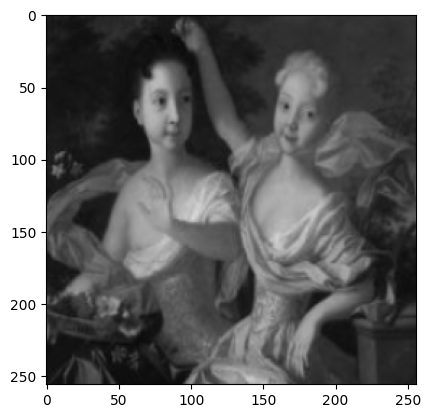

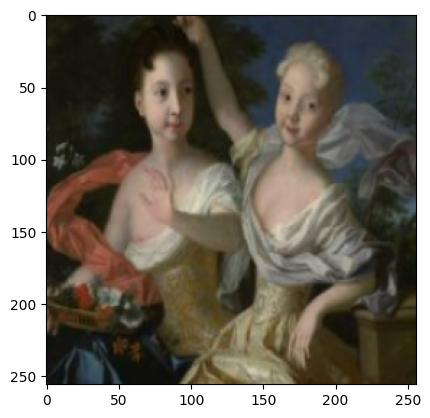

In [84]:
plt.figure()
plt.imshow(np.clip(((load_train_image(train_files[0])[0])+1),0,1));
plt.figure()
plt.imshow(np.clip(((load_train_image(train_files[0])[1])+1),0,1));

## Creación de dataset

Creamos el Dataset con los nombres de las imagenes previamente seleccionadas

In [85]:
train_dataset = tf.data.Dataset.from_tensor_slices(train_files)
train_dataset = train_dataset.map(load_train_image, num_parallel_calls=tf.data.experimental.AUTOTUNE)
train_dataset = train_dataset.batch(batch_size)

val_dataset = tf.data.Dataset.from_tensor_slices(val_files)
val_dataset = val_dataset.map(load_train_image, num_parallel_calls=tf.data.experimental.AUTOTUNE)
val_dataset = val_dataset.batch(batch_size)

test_dataset = tf.data.Dataset.from_tensor_slices(test_files)
test_dataset = test_dataset.map(load_test_image, num_parallel_calls=tf.data.experimental.AUTOTUNE)
test_dataset = test_dataset.batch(batch_size)

## Creación del modelo

Ahora procederemos a crear el modelo explicado en el informe nuestro.

In [86]:
def downsample(filters, batch_norm=True):

  result = Sequential()
  initializer = tf.random_normal_initializer(0, 0.02)

  #Conv
  result.add(Conv2D(filters=filters,strides=2, kernel_size=4, padding='same',
                    kernel_initializer=initializer, use_bias=not batch_norm))
  #Batch
  if batch_norm:
    result.add(BatchNormalization())
  #Activation LeakyRelu
  result.add(LeakyReLU())
  return result

def upsample(filters, dropout=True):
  result = Sequential()
  initializer = tf.random_normal_initializer(0, 0.02)

  #Conv
  result.add(Conv2DTranspose(filters=filters,strides=2, kernel_size=4, padding='same',
                             kernel_initializer=initializer, use_bias=False))
  #Batch
  if dropout:
    result.add(Dropout(0.5))
  #Activation LeakyRelu
  result.add(ReLU())
  return result


#----------------------------Generador-------------------------------------
def Generator():

  initializer = tf.random_normal_initializer(0, 0.02)

  inputs = Input(shape=[None, None, 3]) # (b, 256, 256, 3)

  down_stack = [
      downsample(64, batch_norm=False), # (b, 128, 128, 64)
      downsample(128), # (b, 64, 64, 128)
      downsample(256), # (b, 32, 32, 256)
      downsample(512), # (b, 16, 16, 512)
      downsample(512), # (b, 8, 8, 512)
      downsample(512), # (b, 4, 4, 512)
      downsample(512), # (b, 2, 2, 512)
      downsample(512)  # (b, 1, 1, 512)
  ]

  up_stack = [
      upsample(512), # (b, 2, 2, 1024)
      upsample(512), # (b, 4, 4, 1024)
      upsample(512), # (b, 8, 8, 1024)
      upsample(512, dropout=False), # (b, 16, 16, 1024)
      upsample(256, dropout=False), # (b, 32, 32, 512)
      upsample(128, dropout=False), # (b, 64, 64, 256)
      upsample(64, dropout=False), # (b, 128, 128, 128)

  ]

  last = Conv2DTranspose(filters=3, kernel_size=4, strides=2, padding="same", kernel_initializer=initializer,
                         activation='tanh')

  x = inputs
  s = []
  concat = Concatenate()
  for enc in down_stack:
    x = enc(x)
    s.append(x)
  s = reversed(s[:-1])

  for dec, sk in zip(up_stack, s):
    x = dec(x)
    x = concat([x, sk])

  output = last(x)

  return Model(inputs=inputs, outputs=output)

#----------------------------Discriminador-------------------------------------

def Discriminator():
  real_input = Input(shape=[None, None, 3], name="real_image")
  fake_input = Input(shape=[None, None, 3], name="fake_image")

  con = concatenate([real_input, fake_input])

  initializer = tf.random_normal_initializer(0, 0.02)

  dec1 = downsample(64, batch_norm=False)(con)
  dec2 = downsample(128)(dec1)
  dec3 = downsample(128)(dec2)
  dec4 = downsample(128)(dec3)

  output = Conv2D(filters=1, kernel_size=4, strides=1, kernel_initializer=initializer, padding='same')(dec4)
  return Model(inputs=[real_input, fake_input], outputs=output)

## Creación de checkpoint y incializacion del modelo

Generamos los optimizadores con Adam como los define el paper oficial de pix2pix e inicializamos o cargamos checkpoints previos de modelos guardados para no tener que entrenar muchas veces.

In [87]:
generator_optimizer = tf.keras.optimizers.Adam(LEARNING_RATE, beta_1=BETA_1)
discriminator_optimizer = tf.keras.optimizers.Adam(LEARNING_RATE, beta_1=BETA_1)

generator = Generator()
discriminator = Discriminator()
checkpoint_prefix = os.path.join(checkpoint_folder, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer = discriminator_optimizer,
                                 generator = generator,
                                 discriminator = discriminator)
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_folder))

## Losses

Definimos las funciones de calculo de costo

In [88]:
#BinaryCrossentropy
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)
def discrimator_loss(disc_real_output, disc_generated_output):

  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)
  fake_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + fake_loss

  return total_disc_loss


def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
  total_gen_loss =  gan_loss +(LAMBDA * l1_loss)

  return total_gen_loss

## Generacion de imagenes para el modelo

Vamos guardando las imagenes finales generadas

In [89]:
def save_generate_images(model, test_input, tar, save_filename, display_imgs=True):
  prediction = model(test_input, training=True)

  if not os.path.exists(path_output):
        os.makedirs(path_output)

  if save_filename:
    tf.keras.preprocessing.image.save_img(path_output + save_filename + '.jpg', prediction[0,...])

  plt.figure(figsize=(10,10))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  if display_imgs:
    for i in range(3):
      plt.subplot(1, 3, i+1)
      plt.title(title[i])

      plt.imshow(np.clip(display_list[i]+ 1,0,1))
      plt.axis('off')

      if save_filename:
        plt.savefig(path_output+'fig_' + save_filename + '.png')  # Guarda la figura completa como PNG

  plt.show()

## Entrenamiento

Definimos el paso de entrenamiento

Algo a tener en cuenta es que si bien los modelos hasta cuando estan haciendo la prediccion tienen (training=True), la realidad es que los pesos no se actualizan a menos que se especifique, como pasa en Train_step.
No asustarse si ven el training=True en validation u otro lugar, ya que eso no influye

In [90]:
def train_step(input_image, target):

  with tf.GradientTape() as gen_tape, tf.GradientTape() as discr_tape:

    output_image = generator(input_image, training=True) # Genero la imagen con el generador

    output_gen_discr = discriminator([output_image, input_image], training=True) # Ingreso con ambas imagenes (generador y original) al discriminador

    output_target_discr = discriminator([target, input_image], training=True) # Ingreso con ambas imagenes (objetivo y original) al discriminador

    discr_loss = discrimator_loss(output_target_discr, output_gen_discr)  #Calculo las losses
    gen_loss = generator_loss(output_gen_discr,output_image, target)

    generator_grads = gen_tape.gradient(gen_loss, generator.trainable_variables)  #Calculo los gradientes
    discriminator_grads = discr_tape.gradient(discr_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_grads, generator.trainable_variables))  #Optimizo los modelos
    discriminator_optimizer.apply_gradients(zip(discriminator_grads, discriminator.trainable_variables))

  return gen_loss, discr_loss


def validation_step(input_image, target):

    output_image = generator(input_image, training=True)
    output_gen_discr = discriminator([output_image, input_image], training=True)
    output_target_discr = discriminator([target, input_image], training=True)

    discr_loss = discrimator_loss(output_target_discr, output_gen_discr)
    gen_loss = generator_loss(output_gen_discr, output_image, target)

    return gen_loss, discr_loss

Definimos el Tensorboard para guardar la loss e imagenes



In [91]:

class TensorBoardWriter(object):
    def __init__(self, save_path, model_name):
        time = datetime.now().strftime("%d-%m-%Y %H:%M:%S")
        nuevo = model_name + str(time)
        self.model_name = model_name
        tboard_path = join('runs', save_path, nuevo)
        self.writer = tf.summary.create_file_writer(tboard_path)

    def plot_to_image(self, figure):
        """Convierte una figura de matplotlib a un tensor de imagen."""
        buf = io.BytesIO()
        plt.savefig(buf, format='png')
        plt.close(figure)
        buf.seek(0)
        image = tf.image.decode_png(buf.getvalue(), channels=4)
        image = tf.expand_dims(image, 0)  # Añade una dimensión 'batch'
        return image

    def log_images(self, model, test_input, tar, step, epoch):
        prediction = model(test_input, training=True)

        # Crear la figura con subplots
        figure, axs = plt.subplots(1, 3, figsize=(15, 5))
        images = [test_input[0], tar[0], prediction[0]]
        titles = ['Input Image', 'Ground Truth', 'Predicted Image']

        for i, (img, title) in enumerate(zip(images, titles)):
            axs[i].imshow(np.clip((img + 1),0,1))
            axs[i].set_title(title)
            axs[i].axis('off')

        # Convierte la figura de matplotlib a un tensor de imagen
        tensor_image = self.plot_to_image(figure)

        # Guardar en TensorBoard
        name="Epoch "+ str(epoch)
        with self.writer.as_default():
            tf.summary.image(name, tensor_image, step=step)

    def update_status(self, epoch, train_loss, val_loss):
        with self.writer.as_default():
            tf.summary.scalar('Train Loss', train_loss, step=epoch)
            tf.summary.scalar('Validation Loss', val_loss, step=epoch)


Definimos el Loop de entrenaiento


In [92]:
def train(train_dataset, validation_dataset, epochs, w_g, w_d):

  for epoch in range(epochs):
    total_loss_g = 0
    total_loss_d = 0

    total_val_loss_g = 0
    total_val_loss_d = 0

    # Entrenamiento
    with tqdm(total=len(train_dataset), desc="Training Progress") as pbar:
      for input_image, target in train_dataset:
        g_loss, d_loss = train_step (input_image, target)
        pbar.update(1)
        pbar.set_description(f"Epoch {epoch+1} - Train: {pbar.n}/{len(train_dataset)}")
        clear_output(wait=True)
        total_loss_g += g_loss
        total_loss_d += d_loss


      train_loss_g = total_loss_g/len(train_dataset)
      train_loss_d = total_loss_d/len(train_dataset)


      # Validación
      with tqdm(total=len(validation_dataset), desc=f"Epoch {epoch+1} Validation") as pbar:
          for input_image, target in validation_dataset:
              g_loss, d_loss = validation_step(input_image, target)
              pbar.update(1)
              total_val_loss_g += g_loss
              total_val_loss_d += d_loss


      val_loss_g = total_val_loss_g/len(validation_dataset)
      val_loss_d = total_val_loss_d/len(validation_dataset)


      w_g.update_status(epoch, train_loss_g, val_loss_g)
      w_d.update_status(epoch, train_loss_d, val_loss_d)


      imgi = 0
      for inp, tar in test_dataset.take(1):
        save_generate_images(generator, inp, tar, str(imgi) + '_' + str(epoch), display_imgs=True)
        w_g.log_images(generator, inp, tar, step=epoch, epoch=epoch)
        imgi +=1
      # clear_output(wait=True)

      ##Saving
      if (epoch + 1) % 10 == 0:
        checkpoint.save(file_prefix=checkpoint_prefix)

Procedemos a entrenar.

Si bien dice que se va a entrenar con 100 epocas, se decidió parar a las 25 epocas porque se observo que el resultado ya masomenos era aceptable y dejarlo mas epocas podia ocacionar overfitting.

In [ ]:
# %rm -rf runs/modelo_painting
# %mkdir runs/modelo_painting

In [93]:
writer_g = TensorBoardWriter('modelo_painting','g_')
writer_d = TensorBoardWriter('modelo_painting','d_')

train(train_dataset , val_dataset , 30, writer_g, writer_d)

writer_g.writer.close()
writer_d.writer.close()

Buffered data was truncated after reaching the output size limit.

## TensorBoard

In [ ]:
%load_ext tensorboard


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
%tensorboard --logdir runs/modelo_b

<IPython.core.display.Javascript object>

## Test

Procedemos a ver resultados de la red ya entrenada, sobre imagenes del test set, es decir, imagenes que nunca antes vió.

Cargamos el ultimo modelo

In [94]:

generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

generator = Generator()
discriminator = Discriminator()
checkpoint_prefix = os.path.join(checkpoint_folder, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer = discriminator_optimizer,
                                 generator = generator,
                                 discriminator = discriminator)
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_folder))

In [95]:
def plot_predictions(dataloader, model, num_images=6):
    fig, axs = plt.subplots(num_images, 3, figsize=(4, 1.5 * num_images))  # Configura el tamaño adecuado

    # Agrega los títulos una sola vez en la parte superior de las columnas
    axs[0, 0].set_title('Input Image')
    axs[0, 1].set_title('Ground Truth')
    axs[0, 2].set_title('Predicted')

    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.05, hspace=0.1)

    for i, (input_images, ground_truth_images) in enumerate(dataloader):
        if i >= num_images:
            break

        # Realiza la predicción
        predicted_images = model(input_images, training=True)

        # Normalizar las imágenes si es necesario
        input_images = tf.squeeze(input_images).numpy()  # Convierte a numpy después de modificar tensor
        ground_truth_images = tf.squeeze(ground_truth_images).numpy()
        predicted_images = tf.squeeze(predicted_images).numpy()

        # Dibuja las imágenes en cada fila
        axs[i, 0].imshow(np.clip((input_images + 1),0,1))
        axs[i, 0].axis('off')

        axs[i, 1].imshow(np.clip((ground_truth_images + 1),0,1))
        axs[i, 1].axis('off')

        axs[i, 2].imshow(np.clip((predicted_images + 1),0,1))
        axs[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

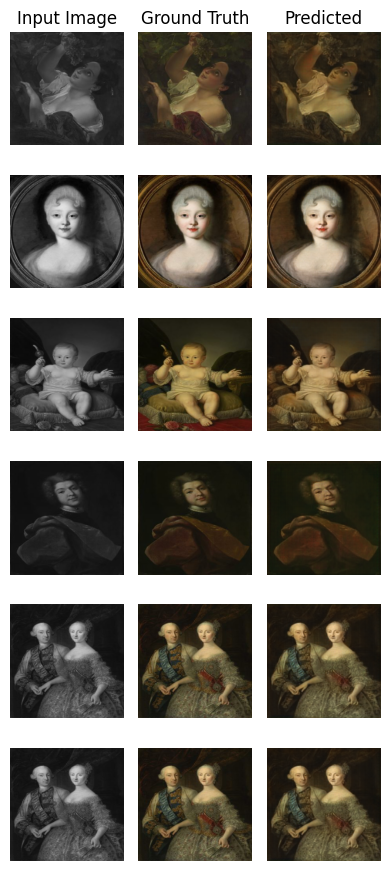

In [96]:
display_n_images = 6

plot_predictions(test_dataset, generator, display_n_images)

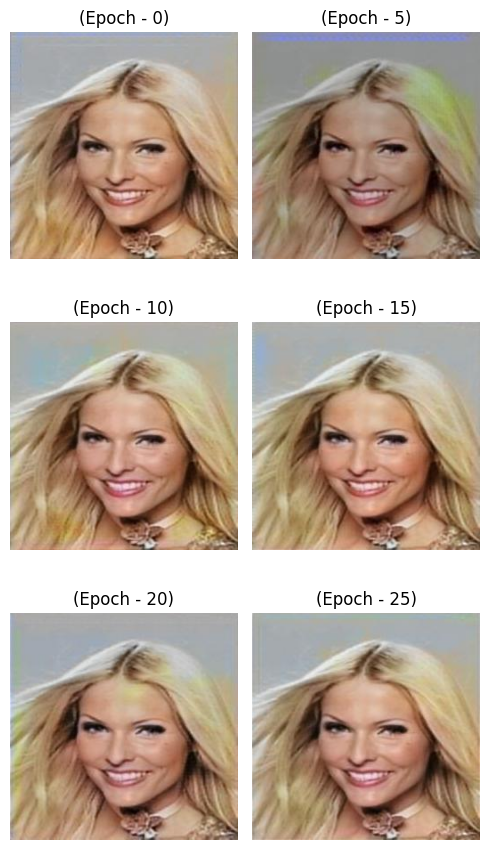

In [75]:
def simulate_epochs(input_image, num_epochs):
    """Esta función simula la transformación de la imagen de entrada a lo largo de los epochs.
    En un caso real, reemplazarías estas simulaciones con el resultado de procesar la imagen con tu modelo."""
    return [len(input_image) * (1 - 0.1 * i) for i in range(1, num_epochs + 1)]

def load_and_display_images(image_paths):
    # Cargar imágenes
    images = [Image.open(path) for path in image_paths]

    # Crear una figura para la visualización
    num_images = len(images)
    fig, axs = plt.subplots(num_images // 2, 2, figsize=(5, 3 * (num_images // 2)))  # Ajusta el tamaño para tu necesidad

    # Títulos personalizados para las imágenes
    titles = [f'(Epoch - {5 * i})' for i in range(0, num_images)]

    for ax, img, title in zip(axs.flatten(), images, titles):
        ax.imshow(img)
        ax.set_title(title)
        ax.axis('off')

    plt.tight_layout()
    plt.show()

def get_image_files(directory_path):
    # Lista para almacenar las rutas completas de los archivos
    image_files = []
    # Tipos de archivos de imagen comunes
    valid_extensions = ('.jpg', '.jpeg', '.png', '.bmp', '.gif')

    # Recorrer el directorio y agregar archivos de imagen a la lista
    for file in os.listdir(directory_path):
        if file.endswith(valid_extensions):
            image_files.append(os.path.join(directory_path, file))

    return image_files

directory_path = '/content/CelebA/graficar/'  # Cambia esto al directorio donde están tus imágenes
image_paths = get_image_files(directory_path)
load_and_display_images(image_paths)

In [ ]:
all_preds = []
all_real = []

for byn, real in test_dataset:
    pred = generator(byn, training=True)
    all_preds.append(pred.numpy().squeeze())
    all_real.append(real.numpy().squeeze())

In [ ]:
np.shape(all_preds)

(250, 256, 256, 3)

## Evaluamos

### Implemenation of Fréchet Inception Distance (FID)

In [ ]:
class FID:
    def __init__(self):
        # Cargar el modelo InceptionV3 con pesos preentrenados de ImageNet
        self.inception = InceptionV3(include_top=False, pooling='avg', input_shape=(299, 299, 3))
        self.inception.trainable = False

    def calculate_fid(self, real_images, generated_images):
        # Preprocesar imágenes para que coincidan con las expectativas de InceptionV3
        real_images = preprocess_input(tf.image.resize(real_images, (299, 299)))
        generated_images = preprocess_input(tf.image.resize(generated_images, (299, 299)))

        # Obtener características
        real_features = self.inception(real_images)
        generated_features = self.inception(generated_images)

        # Calcular estadísticas
        mu_real = tf.reduce_mean(real_features, axis=0)
        sigma_real = tf.math.reduce_std(real_features, axis=0)

        mu_generated = tf.reduce_mean(generated_features, axis=0)
        sigma_generated = tf.math.reduce_std(generated_features, axis=0)

        # Diferencias de las medias y varianzas
        mu_diff = mu_real - mu_generated
        sigma_diff = sigma_real - sigma_generated

        # Calcular el FID
        fid = tf.reduce_sum(mu_diff**2) + tf.reduce_sum(sigma_diff**2)
        return fid.numpy()

In [ ]:
fid_score = fid_calculator.calculate_fid(all_real, all_preds)
print("FID Score:", fid_score)

FID Score: 0.0159291
